# ===============================================
# BLOQUE 1 Imports y configuración
# ===============================================

In [152]:
import numpy as np
from numpy import linspace
import matplotlib.pyplot as plt
from sympy import symbols, sin, cos, pi, integrate, lambdify, simplify, latex, exp
from sympy import init_printing
from sympy import Piecewise
from matplotlib.animation import FuncAnimation

init_printing(use_latex='mathjax') 

In [153]:
x, t = symbols('x t', real=True)

# ===============================================
# BLOQUE 2 — Parámetros físicos del problema
# ===============================================

In [157]:
L = 50      # longitud de la barra
alpha = 2       # difusividad térmica
T0 = 0      # BC en x = 0
TL = 0    # BC en x = L

f = 20

print("Función inicial f(x) =")
display(f)

Función inicial f(x) =


20

In [134]:
L = 30      # longitud de la barra
alpha = 2       # difusividad térmica
T0 = 20      # BC en x = 0
TL = 50    # BC en x = L

f = 60-2*x

print("Función inicial f(x) =")
display(f)

Función inicial f(x) =


60 - 2⋅x

In [116]:
L = 30      # longitud de la cuerda 
a = 4       # velocidad
T0 = 0      # BC en x = 0
TL = 0     # BC en x = L

f = Piecewise(
    (x/10,  (0 <= x) & (x <= 10)),
    ((30-x)/20, (10 < x) & (x <= 30)),
    (0, x > 30),
)

print("Función inicial f(x) por tramos =")
display(f)

Función inicial f(x) por tramos =


⎧  x                        
⎪  ──    for x ≥ 0 ∧ x ≤ 10 
⎪  10                       
⎪                           
⎨3   x                      
⎪─ - ──  for x ≤ 30 ∧ x > 10
⎪2   20                     
⎪                           
⎩  0         for x > 30     

# ===============================================
# BLOQUE 3 - Separación en parte estacionaria + transitoria
# ===============================================


In [158]:

# Parte estacionaria v(x): resolviendo v''(x)=0, v(0)=T0, v(L)=TL
v = T0 + (TL - T0) * (x/L)

print("Solución estacionaria v(x) =")
display(v)

# Condición inicial para v(x,0): v0(x) = f(x) – s(x)
v0 = simplify(f - v)

print("\nv(x,0) = f(x) - s(x) =")
display(v0)


Solución estacionaria v(x) =


0


v(x,0) = f(x) - s(x) =


20

# ===============================================
# BLOQUE 4 - Serie de Fourier para v(x,t)
# ===============================================
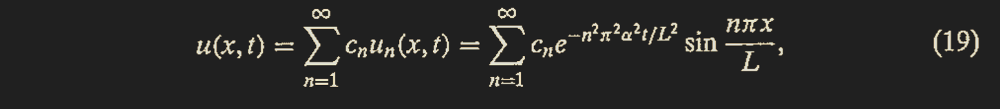
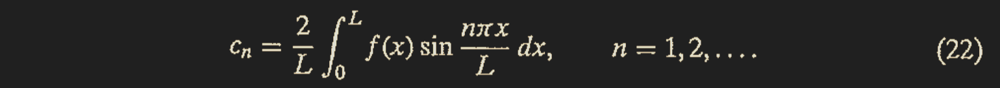

In [159]:
# Fórmula simbólica del coeficiente c_n
n = symbols('n', integer=True, positive=True)
cn_formula = (2/L) * integrate(v0 * sin(n*pi*x/L), (x, 0, L))

print("Coeficiente general c_n =")
display(simplify(cn_formula))

Coeficiente general c_n =


     ⎛        n⎞
40.0⋅⎝1 - (-1) ⎠
────────────────
      π⋅n       

In [160]:
# Para calor
print("u(x,T) =")
display(cn_formula * exp(-(alpha*n*pi/L)**2 * t) * sin(n*pi*x/L))

u(x,T) =


⎛           n       ⎞          2  2           
⎜  40.0⋅(-1)    40.0⎟  -0.128⋅π ⋅n     ⎛π⋅n⋅x⎞
⎜- ────────── + ────⎟⋅ℯ            ⋅sin⎜─────⎟
⎝     π⋅n       π⋅n ⎠                  ⎝ 50  ⎠

In [138]:
# Para onda
print("u(x,t) =")
display(cn_formula * cos(-(alpha*n*pi/L) * t) * sin(n*pi*x/L))

u(x,t) =


⎛          n       ⎞                      
⎜100.0⋅(-1)    80.0⎟    ⎛π⋅n⋅x⎞    ⎛π⋅n⋅t⎞
⎜─────────── + ────⎟⋅sin⎜─────⎟⋅cos⎜─────⎟
⎝    π⋅n       π⋅n ⎠    ⎝ 30  ⎠    ⎝ 15  ⎠

# -------------------------------------------------------
# Cálculo de coeficientes numéricos (Calor)
# -------------------------------------------------------

In [161]:
N = 25
cn = []

for k in range(1, N+1):
    val = float(cn_formula.subs(n, k))
    cn.append(val)

print("\nPrimeros coeficientes c_n (numéricos):")
for i, c in enumerate(cn[:8], 1):
    print(f"c{i} = {c:.6f}")

# -------------------------------------------------------
# Construcción simbólica de la solución v(x,t) truncada
# -------------------------------------------------------

u_series_sym = 0
for k in range(1, N+1):
    ck = cn_formula.subs(n, k)       # coef simbólico
    term = ck * exp(-(alpha*n*pi/L)**2 * t) * sin(n*pi*x/L)
    u_series_sym += term

print("\nSolución v(x,t) truncada simbólica (antes de sumar v(x)):")
display(simplify(u_series_sym))

# -------------------------------------------------------
# Ahora sumamos la parte estacionaria s(x)
# -------------------------------------------------------

u_full_sym = v + u_series_sym

print("\nSolución completa u(x,t)")
display(simplify(u_full_sym))



Primeros coeficientes c_n (numéricos):
c1 = 25.464791
c2 = 0.000000
c3 = 8.488264
c4 = 0.000000
c5 = 5.092958
c6 = 0.000000
c7 = 3.637827
c8 = 0.000000

Solución v(x,t) truncada simbólica (antes de sumar v(x)):


                          2  2           
                  -0.128⋅π ⋅n     ⎛π⋅n⋅x⎞
181.148227091853⋅ℯ            ⋅sin⎜─────⎟
                                  ⎝ 50  ⎠
─────────────────────────────────────────
                    π                    


Solución completa u(x,t)


                          2  2           
                  -0.128⋅π ⋅n     ⎛π⋅n⋅x⎞
181.148227091853⋅ℯ            ⋅sin⎜─────⎟
                                  ⎝ 50  ⎠
─────────────────────────────────────────
                    π                    

# -------------------------------------------------------
# Cálculo de coeficientes numéricos (Onda)
# -------------------------------------------------------

In [140]:
# Coeficiente correcto para ONDA
A_n_formula = (2/L) * integrate(f * sin(n*pi*x/L), (x, 0, L))

N = 10
A = []

for k in range(1, N+1):
    A.append(float(A_n_formula.subs(n, k)))

print("Coeficientes A_n de la onda:")
for i, c in enumerate(A[:8], 1):
    print(f"A{i} = {c:.6f}")

def u_series_onda(x_array, t_value, A, N):
    total = np.zeros_like(x_array)
    for k in range(1, N+1):
        total += A[k-1] * np.sin(k*np.pi*x_array/L) * np.cos((k*np.pi*a/L)*t_value)
    return total

def u_sol_onda(x_array, t_value):
    return u_series_onda(x_array, t_value, A, N)


Coeficientes A_n de la onda:
A1 = 38.197186
A2 = 19.098593
A3 = 12.732395
A4 = 9.549297
A5 = 7.639437
A6 = 6.366198
A7 = 5.456741
A8 = 4.774648


# ===============================================
# BLOQUE 5 — Construcción de u(x,t) (ECUACIÓN DE CALOR)
# ===============================================

In [162]:
x_vals = np.linspace(0, L, 300)

def v_series_calor(x_array, t_value, cn, N):
    total = np.zeros_like(x_array)
    for k in range(1, N+1):
        total += cn[k-1] * np.sin(k*np.pi*x_array/L) * np.exp(-alpha*(k*np.pi/L)**2 * t_value)
    return total

# Parte estacionaria del calor: v(x)
v_func = lambdify(x, v, 'numpy')

def u_sol_calor(x_array, t_value):
    return v_func(x_array) + v_series_calor(x_array, t_value, cn, N)

# test
u_sol_calor(x_vals, 0)


array([0.00000000e+00, 3.46389334e+00, 6.84234774e+00, 1.00537120e+01,
       1.30237107e+01, 1.56886449e+01, 1.79980390e+01, 1.99165995e+01,
       2.14253906e+01, 2.25221755e+01, 2.32209193e+01, 2.35504949e+01,
       2.35526796e+01, 2.32795651e+01, 2.27905347e+01, 2.21489856e+01,
       2.14189787e+01, 2.06620045e+01, 1.99340359e+01, 1.92830236e+01,
       1.87469547e+01, 1.83525633e+01, 1.81147373e+01, 1.80366284e+01,
       1.81104248e+01, 1.83187152e+01, 1.86363338e+01, 1.90325562e+01,
       1.94734967e+01, 1.99245534e+01, 2.03527483e+01, 2.07288242e+01,
       2.10289785e+01, 2.12361448e+01, 2.13407605e+01, 2.13409980e+01,
       2.12424692e+01, 2.10574476e+01, 2.08036809e+01, 2.05028916e+01,
       2.01790779e+01, 1.98567379e+01, 1.95591385e+01, 1.93067444e+01,
       1.91159063e+01, 1.89978873e+01, 1.89582811e+01, 1.89968453e+01,
       1.91077482e+01, 1.92801948e+01, 1.94993767e+01, 1.97476686e+01,
       2.00059800e+01, 2.02551637e+01, 2.04773805e+01, 2.06573273e+01,
      

# ===============================================
# BLOQUE 5 — Construcción de u(x,t) (ECUACIÓN DE ONDA)
# ===============================================

In [123]:
x_vals = np.linspace(0, L, 300)

def u_series_onda(x_array, t_value, A, N):
    total = np.zeros_like(x_array)
    for k in range(1, N+1):
        total += A[k-1] * np.sin(k*np.pi*x_array/L) * np.cos((k*np.pi*a/L)*t_value)
    return total

def u_sol_onda(x_array, t_value):
    return u_series_onda(x_array, t_value, A, N)

# test
u_sol_onda(x_vals, 0)


array([0.00000000e+00, 1.01054342e-02, 2.02117762e-02, 3.03199012e-02,
       4.04306196e-02, 5.05446463e-02, 6.06625715e-02, 7.07848341e-02,
       8.09116975e-02, 9.10432294e-02, 1.01179285e-01, 1.11319494e-01,
       1.21463252e-01, 1.31609718e-01, 1.41757817e-01, 1.51906241e-01,
       1.62053467e-01, 1.72197767e-01, 1.82337236e-01, 1.92469810e-01,
       2.02593302e-01, 2.12705433e-01, 2.22803869e-01, 2.32886263e-01,
       2.42950300e-01, 2.52993736e-01, 2.63014450e-01, 2.73010488e-01,
       2.82980111e-01, 2.92921839e-01, 3.02834497e-01, 3.12717256e-01,
       3.22569674e-01, 3.32391726e-01, 3.42183841e-01, 3.51946924e-01,
       3.61682375e-01, 3.71392104e-01, 3.81078541e-01, 3.90744627e-01,
       4.00393817e-01, 4.10030056e-01, 4.19657758e-01, 4.29281777e-01,
       4.38907366e-01, 4.48540128e-01, 4.58185962e-01, 4.67851005e-01,
       4.77541557e-01, 4.87264008e-01, 4.97024760e-01, 5.06830135e-01,
       5.16686290e-01, 5.26599120e-01, 5.36574163e-01, 5.46616502e-01,
      

# ===============================================
# BLOQUE 6 — Gráficas 
# ===============================================

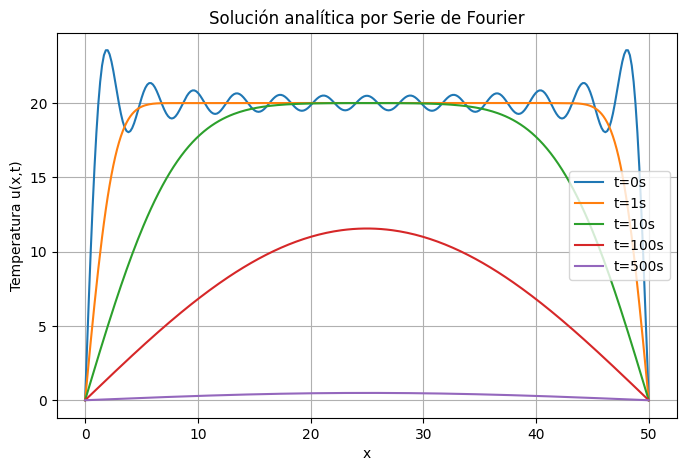

In [163]:
x_vals = np.linspace(0, L, 300)
t_list = [0, 1, 10, 100, 500]

plt.figure(figsize=(8,5))

for ti in t_list:
    ui = u_sol_calor(x_vals, ti)
    # ui = u_sol_onda(x_vals, ti)
    plt.plot(x_vals, ui, label=f"t={ti}s")

plt.title("Solución analítica por Serie de Fourier")
plt.xlabel("x")
plt.ylabel("Temperatura u(x,t)")
plt.legend()
plt.grid(True)
plt.show()


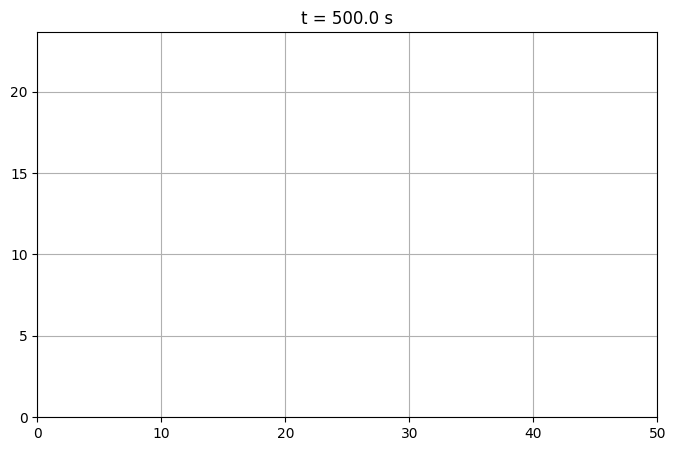

In [113]:
# Figura nueva para la animación
fig, ax = plt.subplots(figsize=(8,5))

# Línea vacía que se va a actualizar
line, = ax.plot([], [], lw=2)

ax.set_xlim(0, L)
ax.set_ylim(np.min(u_sol_calor(x_vals, 500)), np.max(u_sol_calor(x_vals, 0)))
ax.grid(True)

# Definir tiempos para la animación
t_anim = np.linspace(0, 500, 300)

def init():
    line.set_data([], [])
    return line,

def update(frame):
    t_val = t_anim[frame]
    u_val = u_sol_calor(x_vals, t_val)  # o u_sol_onda
    line.set_data(x_vals, u_val)
    ax.set_title(f"t = {t_val:.1f} s")
    return line,

anim = FuncAnimation(
    fig,
    update,
    frames=len(t_anim),
    init_func=init,
    interval=50,
    blit=False
)


from IPython.display import HTML
HTML(anim.to_jshtml())


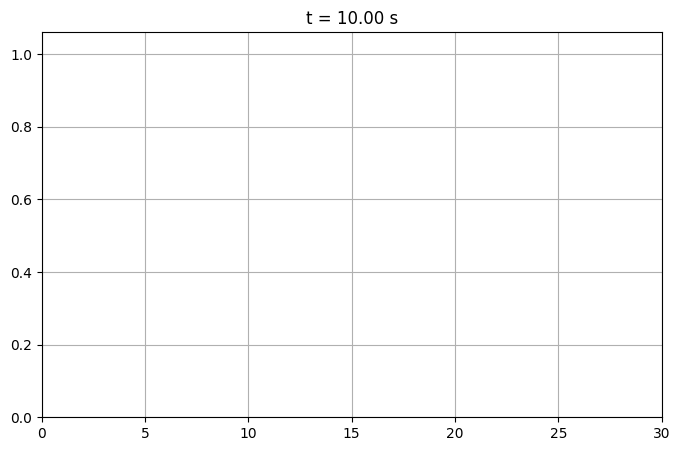

In [104]:
# Figura nueva para la animación
fig, ax = plt.subplots(figsize=(8,5))

# Línea vacía que se va a actualizar
line, = ax.plot([], [], lw=2)

# Elige el modelo con una sola línea
modelo = "onda"   # o "onda"

if modelo == "calor":
    u_test_min = u_sol_calor(x_vals, 500)
    u_test_max = u_sol_calor(x_vals, 0)
    ax.set_ylim(np.min(u_test_min), np.max(u_test_max))

elif modelo == "onda":
    u_test = u_sol_onda(x_vals, 0)
    ax.set_ylim(np.min(u_test)*1.1, np.max(u_test)*1.1)

ax.set_xlim(0, L)
ax.grid(True)

# Definir tiempos para la animación
if modelo == "calor":
    t_anim = np.linspace(0, 500, 300)
else:
    t_anim = np.linspace(0, 10, 300)  # ⚠ la onda oscila rápido → no uses 500 s

def init():
    line.set_data([], [])
    return line,

def update(frame):
    t_val = t_anim[frame]
    
    if modelo == "calor":
        u_val = u_sol_calor(x_vals, t_val)
    else:  # onda
        u_val = u_sol_onda(x_vals, t_val)
    
    line.set_data(x_vals, u_val)
    ax.set_title(f"t = {t_val:.2f} s")
    return line,

anim = FuncAnimation(
    fig,
    update,
    frames=len(t_anim),
    init_func=init,
    interval=50,
    blit=False
)

from IPython.display import HTML
HTML(anim.to_jshtml())


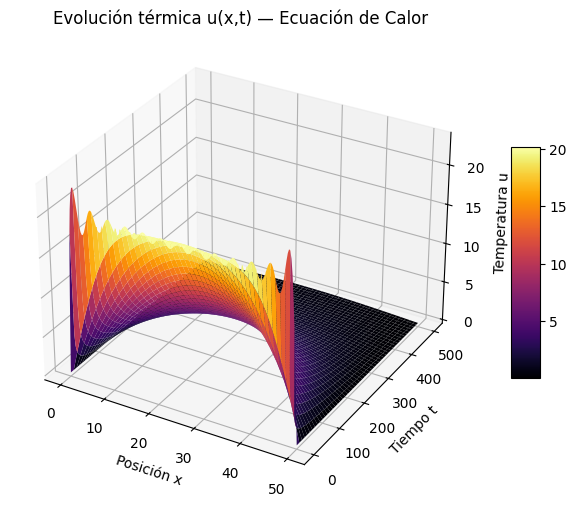

In [164]:
# ===============================================
# BLOQUE — Superficie 3D u(x,t) para la ecuación de calor
# ===============================================
from mpl_toolkits.mplot3d import Axes3D

# Mallado de espacio y tiempo
x_vals = np.linspace(0, L, 200)
t_vals = np.linspace(0, 500, 200)

X, T = np.meshgrid(x_vals, t_vals)

# Matriz U(x,t)
U = np.zeros_like(X)

for i in range(len(t_vals)):
    U[i, :] = u_sol_calor(x_vals, t_vals[i])

# Figura 3D
fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(111, projection='3d')

surf = ax.plot_surface(X, T, U, cmap='inferno', edgecolor='none')

ax.set_title("Evolución térmica u(x,t) — Ecuación de Calor")
ax.set_xlabel("Posición x")
ax.set_ylabel("Tiempo t")
ax.set_zlabel("Temperatura u")

fig.colorbar(surf, shrink=0.5, aspect=8)
plt.show()


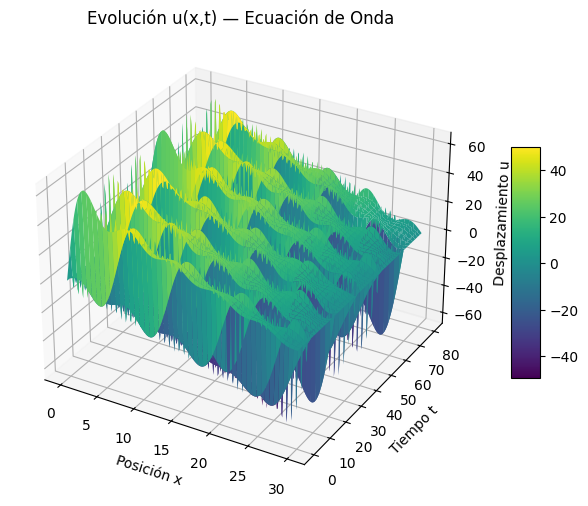

In [145]:
# ===============================================
# BLOQUE — Superficie 3D u(x,t) para la ecuación de onda
# ===============================================
from mpl_toolkits.mplot3d import Axes3D

# Mallado de espacio y tiempo
x_vals = np.linspace(0, L, 200)
t_vals = np.linspace(0, 80, 200)  # la onda oscila rápido → tiempos pequeños

X, T = np.meshgrid(x_vals, t_vals)

# Matriz U(x,t)
U = np.zeros_like(X)

for i in range(len(t_vals)):
    U[i, :] = u_sol_onda(x_vals, t_vals[i])

# Figura 3D
fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(111, projection='3d')

surf = ax.plot_surface(X, T, U, cmap='viridis', edgecolor='none')

ax.set_title("Evolución u(x,t) — Ecuación de Onda")
ax.set_xlabel("Posición x")
ax.set_ylabel("Tiempo t")
ax.set_zlabel("Desplazamiento u")

fig.colorbar(surf, shrink=0.5, aspect=8)
plt.show()


In [155]:
# ===============================================
# DEFINICIÓN RÁPIDA DE explicit_fd (FTCS)
# ===============================================

def explicit_fd(f_init, L, a, T0, TL, nx=200, t_max=80):
    """
    Esquema explícito FTCS para ecuación de calor:
        u_t = a * u_xx
    con BC: u(0,t)=T0, u(L,t)=TL
    """

    dx = L/(nx-1)
    dt = 0.4 * dx**2 / a     # estabilidad CFL
    nt = int(t_max / dt) + 1

    x_grid = np.linspace(0, L, nx)
    times = np.linspace(0, t_max, nt)

    u = f_init(x_grid)             # condición inicial
    u[0], u[-1] = T0, TL           # condiciones de frontera

    hist = np.zeros((nt, nx))
    hist[0] = u.copy()

    r = a * dt / dx**2             # número de Fourier

    for k in range(1, nt):
        un = u.copy()
        u[1:-1] = un[1:-1] + r * (un[2:] - 2*un[1:-1] + un[:-2])
        u[0], u[-1] = T0, TL
        hist[k] = u.copy()

    return x_grid, times, hist


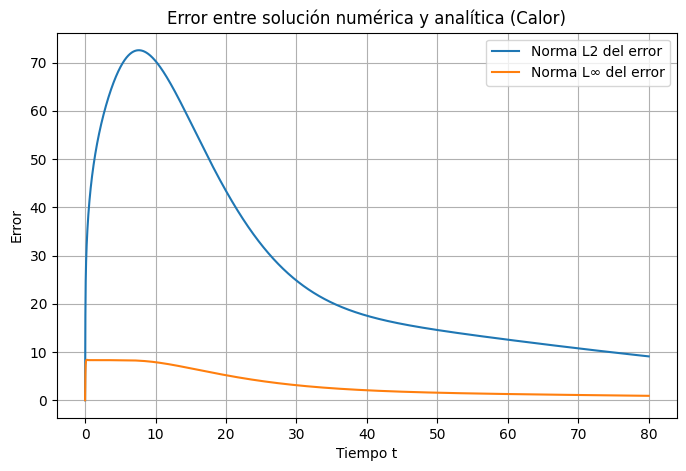

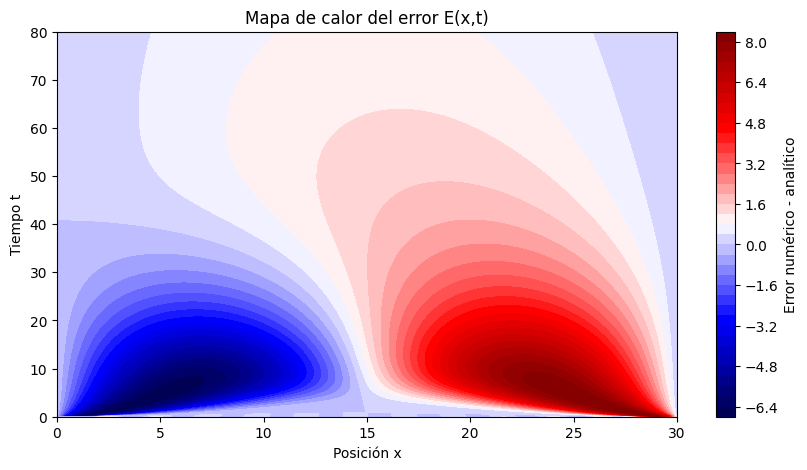

In [156]:
# ===============================================
# BLOQUE — PROTOTIPO DE ANÁLISIS DE ERROR
# ===============================================

import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# 1. Solución numérica (FTCS)
# -----------------------------

# f_init_fn ya debe estar definido o puedes definir uno simple:
f_init_fn = lambda X: u_sol_calor(X,0)   # usa tu calor como inicial

x_fd, times_fd, u_fd = explicit_fd(
    f_init_fn, L, a, T0, TL,
    nx=200, t_max=80
)

# -----------------------------
# 2. Solución analítica
# -----------------------------

X = x_fd
T = times_fd

U_analytic = np.zeros_like(u_fd)
for i, t in enumerate(T):
    U_analytic[i] = u_sol_calor(X, t)

# -----------------------------
# 3. Error puntual
# -----------------------------
Error = u_fd - U_analytic

# Normas
L2 = np.sqrt(np.sum(Error**2, axis=1))
Linf = np.max(np.abs(Error), axis=1)

# -----------------------------
# 4. Plots del error
# -----------------------------

plt.figure(figsize=(8,5))
plt.plot(T, L2, label='Norma L2 del error')
plt.plot(T, Linf, label='Norma L∞ del error')
plt.xlabel("Tiempo t")
plt.ylabel("Error")
plt.title("Error entre solución numérica y analítica (Calor)")
plt.grid(True)
plt.legend()
plt.show()

# -----------------------------
# 5. Mapa de calor del error
# -----------------------------

plt.figure(figsize=(10,5))
plt.contourf(X, T, Error, 40, cmap='seismic')
plt.colorbar(label="Error numérico - analítico")
plt.xlabel("Posición x")
plt.ylabel("Tiempo t")
plt.title("Mapa de calor del error E(x,t)")
plt.show()
